# GET THE DATA

### GET DATA with correct class redistribution and one hote encoding

In [35]:
import sys, os
sys.path.insert(0, os.path.join("/Users/eagle/Documents/eagle-classification", "ChannelViT"))
from load_data import Load_Data
from utils import count_data_per_class, convert_labels_to_one_hot, count_data_per_multiclass
num_classes = 5
path_Duramat = "/Users/eagle/FFHS/eagle-bfe - data/Duramat_no_pool_labels.pkl"
# directory_path = os.path.dirname(current_dir)+"/eagle-labelling/features_pickle/"
data_loader =  Load_Data(path_Duramat)
data_Duramat = data_loader.get_data()
label_counts_duramat = count_data_per_class(data_Duramat)
count_data_per_multiclass(data_Duramat)
labels = [item[1] for item in data_Duramat]  # Extract the labels (tensors)
data_Duramat = convert_labels_to_one_hot(data_Duramat, num_classes=num_classes)

{0: 5877, 1: 3242, 2: 3662, 3: 2179}
{'good': 5877, 'crack': 3242, 'cross': 3662, 'dark': 2179}
{0: 5877, 1: 158, 2: 985, 3: 28, 4: 933, 5: 407, 6: 1744}
{'good': 5877, 'crack': 158, 'cross': 985, 'dark': 28, 'crack&cross': 933, 'crack&dark': 407, 'crack&cross&dark': 1744}


# GET MODEL

In [36]:
data_Duramat

[(array([[36, 36, 39, ..., 50, 50, 48],
         [32, 35, 41, ..., 47, 50, 50],
         [39, 42, 45, ..., 47, 51, 53],
         ...,
         [26, 26, 26, ..., 49, 48, 45],
         [26, 26, 26, ..., 49, 49, 47],
         [26, 26, 26, ..., 47, 47, 42]], dtype=uint8),
  tensor([1., 0., 0., 0., 0.])),
 (array([[24, 24, 24, ..., 38, 36, 31],
         [24, 24, 24, ..., 36, 37, 36],
         [24, 24, 25, ..., 32, 34, 35],
         ...,
         [37, 37, 37, ..., 46, 46, 46],
         [40, 41, 38, ..., 44, 44, 43],
         [38, 46, 43, ..., 45, 49, 47]], dtype=uint8),
  tensor([1., 0., 0., 0., 0.])),
 (array([[26, 26, 26, ..., 26, 26, 26],
         [26, 26, 26, ..., 26, 26, 26],
         [26, 26, 26, ..., 26, 26, 26],
         ...,
         [36, 39, 38, ..., 50, 53, 54],
         [34, 33, 31, ..., 51, 52, 51],
         [29, 31, 30, ..., 52, 52, 52]], dtype=uint8),
  tensor([1., 0., 0., 0., 0.])),
 (array([[25, 27, 26, ..., 26, 26, 26],
         [25, 25, 25, ..., 26, 26, 26],
         [25, 

In [37]:
from transformers import ViTFeatureExtractor, ViTForImageClassification
from transformers import TrainingArguments, Trainer


In [38]:
import torch
from transformers import ViTFeatureExtractor
model_ckpt = 'google/vit-base-patch16-224-in21k'
device = torch.device('cpu' if torch.cuda.is_available() else 'cpu')
extractor = ViTFeatureExtractor.from_pretrained(model_ckpt)   #problem_type="multi_label_classification"  --> label torch.tensor([[1, 1, 0, 0]])
device

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


device(type='cpu')

#### Transform for integers labels

In [39]:
# ...existing code...
def batch_transform_new(examples):
    """
    Accepts:
      - a list of tuples (numpy_image_array, torch_label_tensor)  OR
      - a list of dicts with keys like 'image'/'images' and 'labels'  OR
      - a dict with keys 'images' and 'labels' (as before)
    Returns extractor output with 'pixel_values' (pt) and stacked 'labels' (torch.Tensor).
    Automatically converts grayscale (H,W) or (H,W,1) arrays to RGB.
    """
    import numpy as np
    import torch
    from PIL import Image

    # normalize examples -> imgs, labs lists
    if isinstance(examples, dict):
        imgs = list(examples.get("images", examples.get("image", examples.get("pixel_values", []))))
        labs = list(examples.get("labels", []))
    elif isinstance(examples, (list, tuple)):
        imgs = []
        labs = []
        for e in examples:
            if isinstance(e, (list, tuple)) and len(e) >= 2:
                imgs.append(e[0])
                labs.append(e[1])
            elif isinstance(e, dict):
                imgs.append(e.get("image") or e.get("images") or e.get("pixel_values"))
                labs.append(e.get("labels") or e.get("label"))
            else:
                raise ValueError("Unsupported example element. Expect (image, label) or dict.")
    else:
        raise ValueError("Unsupported examples type for batch_transform")

    # convert each image array/tensor to a PIL RGB image
    pil_imgs = []
    for im in imgs:
        # convert torch.Tensor -> numpy
        if isinstance(im, torch.Tensor):
            arr = im.detach().cpu().numpy()
        else:
            arr = np.asarray(im)

        # handle grayscale -> RGB
        if arr.ndim == 2:
            arr = np.stack([arr, arr, arr], axis=2)
        elif arr.ndim == 3 and arr.shape[2] == 1:
            arr = np.concatenate([arr, arr, arr], axis=2)
        # ensure uint8
        if arr.dtype != np.uint8:
            arr = arr.astype(np.uint8)

        pil_imgs.append(Image.fromarray(arr))

    # run extractor (returns dict with 'pixel_values' as torch.Tensor)
    inputs = extractor(pil_imgs, return_tensors="pt")

    # prepare labels: stack if tensors, else convert to tensor
    if len(labs) == 0:
        labels_tensor = torch.tensor([])
    else:
        if isinstance(labs[0], torch.Tensor):
            labels_tensor = torch.stack([l.detach().cpu() for l in labs])
        else:
            labels_tensor = torch.tensor(labs)

    inputs["labels"] = labels_tensor
    return inputs
# ...existing code...

#### Transform for one hot encoding labels

In [40]:
df_transformed_new = batch_transform_new(data_Duramat)
df_transformed_new.keys()
df_transformed_new['pixel_values'].shape, df_transformed_new['labels']

(torch.Size([10132, 3, 224, 224]),
 tensor([[1., 0., 0., 0., 0.],
         [1., 0., 0., 0., 0.],
         [1., 0., 0., 0., 0.],
         ...,
         [1., 0., 0., 0., 0.],
         [1., 0., 0., 0., 0.],
         [1., 0., 0., 0., 0.]]))

In [41]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(df_transformed_new.pixel_values, df_transformed_new.labels, test_size=.3, random_state=42, stratify=df_transformed_new.labels)
X_train.shape, X_val.shape


(torch.Size([7092, 3, 224, 224]), torch.Size([3040, 3, 224, 224]))

In [42]:
df_transformed_new.labels

tensor([[1., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0.],
        ...,
        [1., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0.]])

In [43]:
from datasets import Dataset
ds_train = Dataset.from_dict({
                "pixel_values": X_train,
                "labels": y_train
            })
ds_train

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 7092
})

In [44]:
ds_val = Dataset.from_dict({
                "pixel_values": X_val,
                "labels": y_val
            })
ds_val

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 3040
})

In [45]:
import numpy as np
num_labels = 5


print(f"num_labels={num_labels}, labels_min={min(labels)}, labels_max={max(labels)}")
# sanity: ensure label values fit expected range if they are ints
try:
    if all(isinstance(l, (int, np.integer)) for l in labels):
        assert max(labels) < num_labels, "label values exceed num_labels-1"
except AssertionError as e:
    print("Label range check failed:", e)

model = ViTForImageClassification.from_pretrained(
    model_ckpt,
    num_labels=num_labels,

)
# set problem type to match your label tensors:
# - single_label_classification for scalar int labels
# - multi_label_classification for multi-hot vectors
model.config.problem_type = "multi_label_classification"

model = model.to(device)

num_labels=5, labels_min=0, labels_max=6
Label range check failed: label values exceed num_labels-1


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [46]:
batch_size = 16
logging_steps = len(X_train) // batch_size
training_args = TrainingArguments(output_dir='./working/',
                                 per_device_train_batch_size=batch_size,
                                 per_device_eval_batch_size=batch_size,
                                 evaluation_strategy='epoch',
                                 save_strategy='epoch',
                                 num_train_epochs=5,
                                 fp16=True if torch.cuda.is_available() else False,
                                 no_cuda=True,
                                 learning_rate=1e-5,
                                 save_total_limit=2,
                                 remove_unused_columns=False,
                                 push_to_hub=False,
                                 load_best_model_at_end=True)

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1590: FutureWarning: using `no_cuda` is deprecated and will be removed in version 5.0 of 🤗 Transformers. Use `use_cpu` instead
  warnings.warn(


In [47]:
ds_train

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 7092
})

In [48]:
import torch
from transformers import DefaultDataCollator # You might use DataCollatorWithPadding if you have variable-length sequences, but DefaultDataCollator works for fixed-size images.

class ContiguousDataCollator(DefaultDataCollator):
    """
    Custom collator to ensure the 'pixel_values' tensor is contiguous.
    This fixes the RuntimeError on certain backends like MPS.
    """
    def __call__(self, features):
        # 1. Use the parent class's call method to assemble the batch
        batch = super().__call__(features)
        
        # 2. Check for the 'pixel_values' key (your input tensor)
        if 'pixel_values' in batch:
            # 🌟 Apply the .contiguous() fix
            batch['pixel_values'] = batch['pixel_values'].contiguous()
            batch['labels'] = batch['labels'].contiguous()
        # 3. Return the modified batch
        return batch

print("Defined custom data collator: ContiguousDataCollator.")
data_collator = ContiguousDataCollator()
# Explicitly set the device to CPU
DEVICE = torch.device('cpu') 

# Make sure your model is moved to this device
model.to(DEVICE)
# ...existing code...
def compute_metrics(p):
    import numpy as np
    from sklearn.metrics import accuracy_score, f1_score

    logits = p.predictions
    # some HF Trainer return (logits, hidden) tuples
    if isinstance(logits, (tuple, list)):
        logits = logits[0]
    labels = p.label_ids

    # multiclass / scalar labels case
    if labels.ndim == 1:
        preds = np.argmax(logits, axis=-1)
        return {
            "accuracy": accuracy_score(labels, preds),
            "f1": f1_score(labels, preds, average="weighted"),
        }

    # 2D labels: could be one-hot (single-label) or multi-hot (multi-label)
    if labels.ndim == 2:
        row_sums = labels.sum(axis=1)
        # one-hot encoded single-label (exactly one '1' per row)
        if np.all(row_sums == 1):
            true = labels.argmax(axis=1)
            preds = np.argmax(logits, axis=-1)
            return {
                "accuracy": accuracy_score(true, preds),
                "f1": f1_score(true, preds, average="weighted"),
            }

        # multi-hot multi-label case -> use sigmoid + threshold, use micro/sample F1
        # apply sigmoid safely
        probs = 1.0 / (1.0 + np.exp(-logits))
        preds = (probs > 0.5).astype(int)
        true = labels.astype(int)
        f1_micro = f1_score(true, preds, average="micro")
        # subset accuracy (exact match)
        subset_acc = np.mean(np.all(true == preds, axis=1))
        return {
            "subset_accuracy": float(subset_acc),
            "f1_micro": float(f1_micro),
        }

    # fallback
    preds = np.argmax(logits, axis=-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1": f1_score(labels, preds, average="weighted"),
    }
def compute_metrics(p):
    import numpy as np
    from sklearn.metrics import f1_score, accuracy_score

    logits = p.predictions
    if isinstance(logits, (tuple, list)):
        logits = logits[0]
    labels = p.label_ids  # shape (batch, num_labels), floats 0/1

    # apply sigmoid to logits
    probs = 1.0 / (1.0 + np.exp(-logits))
    preds = (probs > 0.5).astype(int)
    true = labels.astype(int)

    # multi-label metrics
    f1_micro = f1_score(true, preds, average='micro')
    f1_samples = f1_score(true, preds, average='samples')
    subset_acc = float(np.mean(np.all(true == preds, axis=1)))

    return {
        "f1_micro": float(f1_micro),
        "f1_samples": float(f1_samples),
        "subset_accuracy": subset_acc
    }
trainer = Trainer(model=model,
                 args=training_args,
                 data_collator=data_collator,
                 compute_metrics=compute_metrics,
                 train_dataset=ds_train,
                 eval_dataset=ds_val,
                 tokenizer=extractor)

Defined custom data collator: ContiguousDataCollator.


/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_62477/1088575495.py:102: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(model=model,


In [49]:
from torch.utils.data import DataLoader
dl = DataLoader(ds_train, batch_size=8, shuffle=False, collate_fn=data_collator)
batch = next(iter(dl))
print("batch keys:", list(batch.keys()))
print("pixel_values:", batch['pixel_values'].shape, batch['pixel_values'].dtype)
print("labels:", getattr(batch['labels'], 'shape', None), type(batch['labels']), getattr(batch['labels'], 'dtype', None))
print("labels sample (first):", batch['labels'][0])
batch = data_collator([ds_train[i] for i in range(min(4, len(ds_train)))])
print("batch pixel_values:", batch['pixel_values'].shape, batch['pixel_values'].dtype)
print("batch labels:", batch['labels'].shape, batch['labels'].dtype, batch['labels'][0])

batch keys: ['pixel_values', 'labels']
pixel_values: torch.Size([8, 3, 224, 224]) torch.float32
labels: torch.Size([8, 5]) <class 'torch.Tensor'> torch.float32
labels sample (first): tensor([1., 0., 0., 0., 0.])
batch pixel_values: torch.Size([4, 3, 224, 224]) torch.float32
batch labels: torch.Size([4, 5]) torch.float32 tensor([1., 0., 0., 0., 0.])


# TRAIN

In [16]:
print(ds_train)
train_result = trainer.train()

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 7092
})


Epoch,Training Loss,Validation Loss,F1 Micro,F1 Samples,Subset Accuracy
1,No log,0.207779,0.963565,0.968015,0.911513
2,0.286100,0.157930,0.983650,0.984002,0.957895
3,0.171000,0.131705,0.991440,0.992675,0.976316
4,0.136000,0.119425,0.991219,0.992018,0.975658
5,0.117900,0.115138,0.992988,0.993575,0.980592


In [ ]:
import os, json

save_dir = "/Users/eagle/Documents/eagle-classification/saved_vit_dur_inf_one_hot_5_classes/"
os.makedirs(save_dir, exist_ok=True)

# 1) save model and config (includes id2label/label2id)
trainer.save_model(save_dir)            # saves model & config

# 2) save feature extractor / image processor
extractor.save_pretrained(save_dir)     # ViTFeatureExtractor / ViTImageProcessor

# 3) save Trainer state (optional, useful for resuming)
trainer.save_state()

# 4) save any extra metadata (e.g. label order) explicitly
with open(os.path.join(save_dir, "meta.json"), "w") as f:
    json.dump({"id2label": model.config.id2label, "label2id": model.config.label2id}, f)

# LOAD TRAINING

In [50]:
from transformers import ViTForImageClassification, ViTFeatureExtractor, Trainer, TrainingArguments
from datasets import Dataset
import torch, os, json

load_dir = "/Users/eagle/Documents/eagle-classification/saved_vit_dur_inf_one_hot_5_classes/"
device = torch.device("cpu" if torch.cuda.is_available() else "cpu")


# load model + processor
model = ViTForImageClassification.from_pretrained(load_dir)
extractor = ViTFeatureExtractor.from_pretrained(load_dir)
model.to(device)

# optional: create minimal TrainingArguments & Trainer for predict
args = TrainingArguments(output_dir=load_dir, per_device_eval_batch_size=16, no_cuda=not torch.cuda.is_available())
trainer_from_file = Trainer(model=model, args=args, tokenizer=extractor)


/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_62477/2647718611.py:16: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_from_file = Trainer(model=model, args=args, tokenizer=extractor)


# Infinity

In [17]:
import sys, os
sys.path.insert(0, os.path.join("/Users/eagle/Documents/eagle-classification", "ChannelViT"))
from load_data import Load_Data
from utils import count_data_per_class, convert_labels_to_one_hot, count_data_per_multiclass
num_classes = 5

path_Infinity = "/Users/eagle/Documents//eagle-labelling/features_pickle/Infinity_all_no_pool_labels.pkl"
data_loader =  Load_Data(path_Infinity)
data_Infinity_int = data_loader.get_data()
data_loader.get_label_statistics()
label_counts_infinity = count_data_per_class(data_Infinity_int)
count_data_per_multiclass(data_Infinity_int)

data_Infinity = convert_labels_to_one_hot(data_Infinity_int, num_classes)
df_inf_transformed = batch_transform_new(data_Infinity)
ds_test_inf = Dataset.from_dict({
                "pixel_values": df_inf_transformed.pixel_values,
                "labels": df_inf_transformed.labels
            })
ds_test_inf

{0: 2112, 1: 39, 2: 156, 3: 21, 4: 15, 5: 11, 7: 306, 8: 58, 9: 4, 10: 3}
{'good': 2112, 'crack': 39, 'cross': 156, 'dark': 21, 'crack&cross': 15, 'crack&dark': 11, 'corrosion': 306, 'corrosion&cross': 58, 'corrosion&crack&cross': 4, 'corrosion&crack': 3}
{0: 2112, 1: 72, 2: 233, 3: 32, 7: 371}
{'good': 2112, 'crack': 72, 'cross': 233, 'dark': 32, 'corrosion': 371}
{0: 2112, 1: 39, 2: 156, 3: 21, 4: 15, 5: 11, 7: 306, 8: 58, 9: 4, 10: 3}
{'good': 2112, 'crack': 39, 'cross': 156, 'dark': 21, 'crack&cross': 15, 'crack&dark': 11, 'corrosion': 306, 'corrosion&cross': 58, 'corrosion&crack&cross': 4, 'corrosion&crack': 3}


Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 2725
})

# INF and DUR TRAIN

In [ ]:
df_all = batch_transform_new(data_Duramat + data_Infinity)

ds_all = Dataset.from_dict({
                "pixel_values": df_all.pixel_values,
                "labels": df_all.labels
            })
trainer = Trainer(model=model,
                 args=training_args,
                 data_collator=data_collator,
                 compute_metrics=compute_metrics,
                 train_dataset=ds_all,
                 eval_dataset=ds_val,
                 tokenizer=extractor)

train_result = trainer.train()

import os, json

save_dir = "/Users/eagle/Documents/eagle-classification/saved_vit_dur_inf_one_hot_5_classes/"
os.makedirs(save_dir, exist_ok=True)

# 1) save model and config (includes id2label/label2id)
trainer.save_model(save_dir)            # saves model & config

# 2) save feature extractor / image processor
extractor.save_pretrained(save_dir)     # ViTFeatureExtractor / ViTImageProcessor

# 3) save Trainer state (optional, useful for resuming)
trainer.save_state()

# 4) save any extra metadata (e.g. label order) explicitly
with open(os.path.join(save_dir, "meta.json"), "w") as f:
    json.dump({"id2label": model.config.id2label, "label2id": model.config.label2id}, f)

/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_6521/3632901788.py:7: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(model=model,


Epoch,Training Loss,Validation Loss


In [18]:
predictions_inf = trainer_from_file.predict(ds_test_inf)
predlabels_inf = predictions_inf.predictions.argmax(axis=-1)
predictions_inf.metrics


{'test_loss': 0.041722822934389114,
 'test_model_preparation_time': 0.0044,
 'test_runtime': 237.0231,
 'test_samples_per_second': 11.497,
 'test_steps_per_second': 0.721}

In [19]:
predictions_inf.label_ids

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 1.],
       [0., 0., 0., 0., 1.]], dtype=float32)

In [20]:
num_labels=5
import numpy as np
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            # 5: 'discoloration',
            # 6: 'delamination',
        }

# Evaluation cell - uses existing variables: predictions, num_labels, label_names (dict)
from sklearn.metrics import (f1_score, precision_score, recall_score,
                             precision_recall_fscore_support, hamming_loss,
                             multilabel_confusion_matrix, accuracy_score, roc_auc_score)

# prepare predictions and ground truth
logits = predictions_inf.predictions
if isinstance(logits, (tuple, list)):
    logits = logits[0]
probs = 1.0 / (1.0 + np.exp(-logits))
preds = (probs > 0.5).astype(int)
true = predictions_inf.label_ids.astype(int)

# overall multi-label metrics
metrics = {
    "f1_micro": f1_score(true, preds, average="micro"),
    "f1_macro": f1_score(true, preds, average="macro"),
    "precision_micro": precision_score(true, preds, average="micro", zero_division=0),
    "recall_micro": recall_score(true, preds, average="micro", zero_division=0),
    "hamming_loss": hamming_loss(true, preds),
    "subset_accuracy": float(np.mean(np.all(true == preds, axis=1))),
}
print("Overall metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

# per-class precision/recall/f1/support
prec, rec, f1, sup = precision_recall_fscore_support(true, preds, average=None, zero_division=0)
print("\nPer-class metrics:")
for i in range(num_labels):
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  precision={prec[i]:.3f}  recall={rec[i]:.3f}  f1={f1[i]:.3f}  support={int(sup[i])}")

# per-class confusion components (TN, FP, FN, TP)
mlcm = multilabel_confusion_matrix(true, preds)
print("\nPer-class confusion (TN, FP, FN, TP):")
for i, cm in enumerate(mlcm):
    tn, fp, fn, tp = cm.ravel()
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  TN={tn:5d}  FP={fp:5d}  FN={fn:5d}  TP={tp:5d}")

# top-1 accuracy on examples that are single-label in ground truth
single_mask = (true.sum(axis=1) == 1)
if single_mask.any():
    true_single = true[single_mask].argmax(axis=1)
    pred_single = preds[single_mask].argmax(axis=1)
    top1_acc = accuracy_score(true_single, pred_single)
    print(f"\nTop-1 accuracy on single-label examples: {top1_acc:.4f}  (n={int(single_mask.sum())})")
else:
    print("\nNo single-label examples found for top-1 accuracy.")

# try ROC-AUC per class if applicable
try:
    aucs = []
    for i in range(num_labels):
        # require both positive and negative labels for AUC
        if len(np.unique(true[:, i])) > 1:
            aucs.append(roc_auc_score(true[:, i], probs[:, i]))
        else:
            aucs.append(np.nan)
    print("\nPer-class ROC AUC:")
    for i, a in enumerate(aucs):
        name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
        print(f"  [{i}] {name:12s}  AUC={a if np.isnan(a) else f'{a:.4f}'}")
except Exception as e:
    print("\nROC AUC skipped due to error:", e)



Overall metrics:
  f1_micro: 0.9924
  f1_macro: 0.9550
  precision_micro: 0.9936
  recall_micro: 0.9911
  hamming_loss: 0.0032
  subset_accuracy: 0.9905

Per-class metrics:
  [0] good          precision=0.992  recall=1.000  f1=0.996  support=2112
  [1] crack         precision=0.986  recall=0.944  f1=0.965  support=72
  [2] cross         precision=0.996  recall=0.974  f1=0.985  support=233
  [3] dark          precision=1.000  recall=0.719  f1=0.836  support=32
  [4] corrosion     precision=1.000  recall=0.987  f1=0.993  support=371

Per-class confusion (TN, FP, FN, TP):
  [0] good          TN=  597  FP=   16  FN=    1  TP= 2111
  [1] crack         TN= 2652  FP=    1  FN=    4  TP=   68
  [2] cross         TN= 2491  FP=    1  FN=    6  TP=  227
  [3] dark          TN= 2693  FP=    0  FN=    9  TP=   23
  [4] corrosion     TN= 2354  FP=    0  FN=    5  TP=  366

Top-1 accuracy on single-label examples: 0.9928  (n=2634)

Per-class ROC AUC:
  [0] good          AUC=0.9989
  [1] crack        

# WEBSITE

In [2]:
import os
import sys
import importlib

current_dir = '/Users/eagle/Documents/eagle-classification/'
sys.path.append(os.path.join(current_dir, 'eagle-jsonhandler'))
sys.path.append(os.path.join(current_dir, '../'))
eagle_jsonhandler = importlib.import_module("JSONHandler")
PATH = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage"
panellist = eagle_jsonhandler.getGroupedPanelList(PATH+'/overviews/')
classified_cells = []
for classified_by_one in ["Ebrar"]:
    classified_cells.extend(eagle_jsonhandler.getCellsByAttribute(groupedPanels=panellist, attribute="classifiedBy", values=classified_by_one))

elpaths, uvpaths, vispaths, labels = eagle_jsonhandler.getCellsImagePathsAndLabels(classified_cells)

print("total elpaths:", len(elpaths))
print("total labels:", len(labels))

# filter paths and corresponding labels together
filtered_pairs = [(p, l) for p, l in zip(elpaths, labels) if '23_P08_G2' not in p]
if filtered_pairs:
    elpaths_filtered, labels_filtered = zip(*filtered_pairs)
    elpaths_filtered = list(elpaths_filtered)
    labels_filtered = list(labels_filtered)
else:
    elpaths_filtered, labels_filtered = [], []

print("filtered elpaths:", len(elpaths_filtered))
print("filtered labels:", len(labels_filtered))
print("removed:", len(elpaths) - len(elpaths_filtered))

total elpaths: 527
total labels: 527
filtered elpaths: 520
filtered labels: 520
removed: 7


In [3]:
a=[0, 1, 3, 4, 6, 8, 9, 18, 57, 64, 68, 75, 76, 77, 78, 80, 83, 85, 103, 109, 111, 121, 116, 126, 167, 168, 176, 177, 248, 249, 255, 258, 259, 265, 268]
len(a)

35

In [54]:
def rescale_images_to_0_255(images, per_image=True):
    """
    Rescale the R channel to 0-255 and copy the rescaled R into G and B.
    Returns list of PIL.Image (RGB, uint8).
    """
    out = []
    if not per_image:
        # compute global red-channel min/max
        red_min = np.inf
        red_max = -np.inf
        arrs = []
        for im in images:
            if isinstance(im, Image.Image):
                a = np.asarray(im.convert("RGB")).astype(np.float32)
            else:
                a = np.asarray(im).astype(np.float32)
                if a.ndim == 2:
                    a = np.stack([a] * 3, axis=-1)
                elif a.ndim == 3 and a.shape[-1] != 3:
                    a = a[..., :3]
            arrs.append(a)
            rmin = float(a[..., 0].min())
            rmax = float(a[..., 0].max())
            red_min = min(red_min, rmin)
            red_max = max(red_max, rmax)
        # scale using global red range, then replicate to RGB
        for a in arrs:
            if red_max > red_min:
                r = (a[..., 0] - red_min) / (red_max - red_min) * 255.0
            else:
                r = np.zeros_like(a[..., 0], dtype=np.float32)
            r = np.clip(r, 0, 255).astype(np.uint8)
            rgb = np.stack([r, r, r], axis=-1)
            out.append(Image.fromarray(rgb))
        return out

    # per-image scale: scale red channel per image then replicate
    for im in images:
        if isinstance(im, Image.Image):
            im_rgb = im.convert("RGB")
            arr = np.asarray(im_rgb).astype(np.float32)
        else:
            arr = np.asarray(im).astype(np.float32)
            if arr.ndim == 2:
                arr = np.stack([arr] * 3, axis=-1)
            elif arr.ndim == 3 and arr.shape[-1] != 3:
                arr = arr[..., :3]
        mn = float(arr[..., 0].min())
        mx = float(arr[..., 0].max())
        if mx > mn:
            r = (arr[..., 0] - mn) / (mx - mn) * 255.0
        else:
            r = np.zeros_like(arr[..., 0], dtype=np.float32)
        r = np.clip(r, 0, 255).astype(np.uint8)
        rgb = np.stack([r, r, r], axis=-1)
        out.append(Image.fromarray(rgb))
    return out



In [55]:
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image

def summarize_image_list(imgs, name="images", n_preview=6):
    print(f"--- {name} summary ---")
    types = Counter([type(x).__name__ for x in imgs])
    print("types:", types)
    # enforce convertable to numpy
    shapes = Counter()
    modes = Counter()
    mins, maxs, means, stds = [], [], [], []
    channel_sums = None
    count = 0
    for i, im in enumerate(imgs):
        try:
            if isinstance(im, Image.Image):
                modes.update([im.mode])
                arr = np.asarray(im.convert("RGB")).astype(np.float32)  # force RGB for stats
            else:
                arr = np.asarray(im)
                if arr.ndim == 2:
                    arr = np.stack([arr]*3, axis=-1)
                elif arr.ndim == 3 and arr.shape[-1] != 3:
                    # try to slice or convert to 3 channels
                    arr = arr[..., :3]
            shapes.update([arr.shape])
            print(arr[:,:,0].max(),'0 channel mean')
            print(arr[:,:,1].max(),'1 channel mean')
            print(arr[:,:,2].max(),'2 channel mean')
            mins.append(float(arr.min()))
            maxs.append(float(arr.max()))
            means.append(float(arr.mean()))
            stds.append(float(arr.std()))
            if channel_sums is None:
                channel_sums = np.zeros(arr.shape[-1], dtype=np.float64)
            # channel means accumulate
            channel_sums += arr.reshape(-1, arr.shape[-1]).mean(axis=0)
            count += 1
        except Exception as e:
            print(f" skip sample {i}: {e}")
    if count == 0:
        print("no valid images")
        return
    print("count:", count)
    print("modes:", dict(modes))
    print("shapes (sampled):", dict(shapes))
    print(f"global min/max mean/std: min={np.min(mins):.3f}, max={np.max(maxs):.3f}, mean={np.mean(means):.3f}, std={np.mean(stds):.3f}")
    chans = (channel_sums / count).tolist() if channel_sums is not None else None
    if chans:
        print("approx per-channel mean (RGB):", [f"{c:.3f}" for c in chans])
    # preview images
    plt.figure(figsize=(12,3))
    for i in range(min(n_preview, len(imgs))):
        plt.subplot(1, n_preview, i+1)
        im = imgs[i]
        if not isinstance(im, Image.Image):
            im = Image.fromarray(np.asarray(im).astype(np.uint8))
        plt.imshow(im.convert("RGB"))
        plt.axis("off")
    plt.suptitle(f"{name} - first {min(n_preview,len(imgs))} samples")
    plt.show()



527
(527, 7)
332 37 bad_mask
Saved df_web to: /Users/eagle/Documents/eagle-classification/saved_data/df_web.pkl
(158, 2)
--- df_web (after rescale) summary ---
types: Counter({'Image': 2})
255.0 0 channel mean
255.0 1 channel mean
255.0 2 channel mean
255.0 0 channel mean
255.0 1 channel mean
255.0 2 channel mean
count: 2
modes: {'RGB': 2}
shapes (sampled): {(256, 256, 3): 2}
global min/max mean/std: min=0.000, max=255.000, mean=219.928, std=23.298
approx per-channel mean (RGB): ['219.928', '219.928', '219.928']


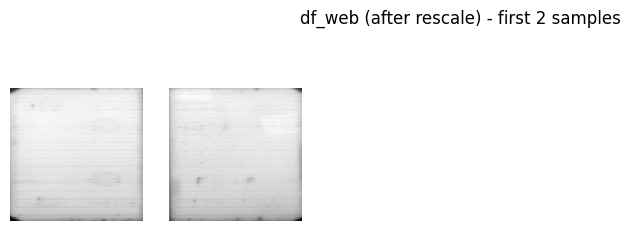

In [72]:
import os
import numpy as np
from PIL import Image
import pandas as pd
from datasets import Dataset

# decode a TIFF path to a PIL image (RGB) and resize
def decode_img_pil(img_path, size=(256, 256)):
    try:
        img = Image.open('/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/'+img_path)
        img = img.convert("RGB")
        img = img.resize(size, Image.LANCZOS)
        return img
    except Exception as e:
        # skip or log bad files
        print(f"skip {img_path}: {e}")
        return None

# extract images (and optional labels) from a list/iterable of file paths
def extract_original_images_from_paths(paths, labels):
    images = []
    for p in paths:
        img = decode_img_pil(p)
        if img is None:
            continue
        images.append(img)  
    labels_cat =[np.argmax(v) for v in labels] # same label extraction as before
    return images, labels

# Usage: ensure `elpaths` is a list/iterable of full file paths (strings)
# e.g. elpaths, uvpaths, vispaths, labels = eagle_jsonhandler.getCellsImagePathsAndLabels(classified_cells)
# flatten or choose the list you want to use (here: use elpaths)
data_paths = elpaths  # must be a Python list of file paths

original_images, original_labels = extract_original_images_from_paths(data_paths, labels)

print(len(original_images))
import numpy as np
import pandas as pd

# original_images, original_labels already defined
labels_arr = np.asarray([np.asarray(l) for l in original_labels])  # handle lists / tensors
print(labels_arr.shape)
# If labels are 2D (one-hot / multi-hot), remove rows where BOTH last two classes == 1
if labels_arr.ndim == 2 and labels_arr.shape[1] >= 2:
    # mark samples where either of the last two classes is 1
    last_two_mask = (labels_arr[:, -2] == 1) | (labels_arr[:, -1] == 1)
    # mark unlabeled samples (all-zero label vectors)
    unlabeled_mask = (labels_arr.sum(axis=1) == 0)
    bad_mask = last_two_mask | unlabeled_mask
    keep_mask = ~bad_mask
    print(last_two_mask.sum(), (unlabeled_mask.sum()),'bad_mask')
else:
    # nothing to remove
    keep_mask = np.ones(len(original_labels), dtype=bool)

# apply mask (works with lists)
filtered_images = [img for keep, img in zip(keep_mask, original_images) if keep]
filtered_labels = [lab for keep, lab in zip(keep_mask, original_labels) if keep]

# filtered_labels is a list -> convert to numpy to slice columns safely
labels_arr_filtered = np.asarray(filtered_labels)
if labels_arr_filtered.ndim == 2 and labels_arr_filtered.shape[1] >= 2:
    # remove the last two classes as intended
    labels_trimmed = labels_arr_filtered[:, 0:-2]
else:
    labels_trimmed = labels_arr_filtered

# store labels as lists in the dataframe (batch_transform_new expects list inputs)
df_web = pd.DataFrame({"images": filtered_images, "labels": labels_trimmed.tolist()})
out_dir = os.path.join(current_dir, "saved_data")
os.makedirs(out_dir, exist_ok=True)
pkl_path = os.path.join(out_dir, "df_web.pkl")
df_web.to_pickle(pkl_path)
print(f"Saved df_web to: {pkl_path}")
print(df_web.shape)
# # build dataframe in the same format your pipeline expects (batch_transform expects 'images' key)
# df_web = pd.DataFrame({"images": original_images, "labels": original_labels})
 
# Apply to df_web images (per-image scaling)
df_web['images'] = rescale_images_to_0_255(df_web['images'], per_image=True)

# reuse your existing batch_transform / extractor to get pixel_values
df_web_transformed = batch_transform_new({
    "images": df_web["images"].tolist(),
    "labels": df_web["labels"].tolist()
})

# make a HuggingFace Dataset if you need it for trainer.predict
ds_web = Dataset.from_dict({
    "pixel_values": df_web_transformed.pixel_values,
    "labels": df_web_transformed.labels
})


# Re-run your checks / transform
summarize_image_list(df_web['images'][:2], name="df_web (after rescale)")


In [ ]:
out_dir = os.path.join(current_dir, "saved_data")
os.makedirs(out_dir, exist_ok=True)
pkl_path = os.path.join(out_dir, "df_web.pkl")
df_web.to_pickle(pkl_path)
print(f"Saved df_web to: {pkl_path}")

AttributeError: 

In [57]:
df_web_transformed['pixel_values'][0].shape

torch.Size([3, 224, 224])

In [58]:
labels = np.asarray(ds_web['labels'])  # HF Dataset -> numpy
if labels.ndim == 1:  # scalar labels case
    unlabeled_mask = labels == 0
else:  # one-hot / multi-hot
    unlabeled_mask = (labels.sum(axis=1) == 0)

n_unlabeled = int(unlabeled_mask.sum())
n_total = labels.shape[0]
print(f"unlabeled (all-zero) = {n_unlabeled} / {n_total} ({n_unlabeled / n_total:.2%})")
print("example unlabeled indices (first 20):", np.where(unlabeled_mask)[0][:20])

unlabeled (all-zero) = 0 / 158 (0.00%)
example unlabeled indices (first 20): []


In [59]:
predictions_web = trainer_from_file.predict(ds_web)
predlabels_web = predictions_web.predictions.argmax(axis=-1)
predictions_web.metrics

{'test_loss': 0.6616591215133667,
 'test_model_preparation_time': 0.002,
 'test_runtime': 12.0346,
 'test_samples_per_second': 13.129,
 'test_steps_per_second': 0.831}

In [ ]:
print(len(predictions_web.predictions))
predictions_web

In [52]:
import numpy as np
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            # 5: 'discoloration',
            # 6: 'delamination',
        }

# Evaluation cell - uses existing variables: predictions, num_labels, label_names (dict)
from sklearn.metrics import (f1_score, precision_score, recall_score,
                             precision_recall_fscore_support, hamming_loss,
                             multilabel_confusion_matrix, accuracy_score, roc_auc_score)

# prepare predictions and ground truth
logits = predictions_web.predictions
if isinstance(logits, (tuple, list)):
    logits = logits[0]
probs = 1.0 / (1.0 + np.exp(-logits))
preds = (probs > 0.5).astype(int)
true = predictions_web.label_ids.astype(int)

# overall multi-label metrics
metrics = {
    "f1_micro": f1_score(true, preds, average="micro"),
    "f1_macro": f1_score(true, preds, average="macro"),
    "precision_micro": precision_score(true, preds, average="micro", zero_division=0),
    "recall_micro": recall_score(true, preds, average="micro", zero_division=0),
    "hamming_loss": hamming_loss(true, preds),
    "subset_accuracy": float(np.mean(np.all(true == preds, axis=1))),
}
print("Overall metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

# per-class precision/recall/f1/support
prec, rec, f1, sup = precision_recall_fscore_support(true, preds, average=None, zero_division=0)
print("\nPer-class metrics:")
for i in range(num_labels):
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  precision={prec[i]:.3f}  recall={rec[i]:.3f}  f1={f1[i]:.3f}  support={int(sup[i])}")

# per-class confusion components (TN, FP, FN, TP)
mlcm = multilabel_confusion_matrix(true, preds)
print("\nPer-class confusion (TN, FP, FN, TP):")
for i, cm in enumerate(mlcm):
    tn, fp, fn, tp = cm.ravel()
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  TN={tn:5d}  FP={fp:5d}  FN={fn:5d}  TP={tp:5d}")

# top-1 accuracy on examples that are single-label in ground truth
single_mask = (true.sum(axis=1) == 1)
if single_mask.any():
    true_single = true[single_mask].argmax(axis=1)
    pred_single = preds[single_mask].argmax(axis=1)
    top1_acc = accuracy_score(true_single, pred_single)
    print(f"\nTop-1 accuracy on single-label examples: {top1_acc:.4f}  (n={int(single_mask.sum())})")
else:
    print("\nNo single-label examples found for top-1 accuracy.")

# try ROC-AUC per class if applicable
try:
    aucs = []
    for i in range(num_labels):
        # require both positive and negative labels for AUC
        if len(np.unique(true[:, i])) > 1:
            aucs.append(roc_auc_score(true[:, i], probs[:, i]))
        else:
            aucs.append(np.nan)
    print("\nPer-class ROC AUC:")
    for i, a in enumerate(aucs):
        name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
        print(f"  [{i}] {name:12s}  AUC={a if np.isnan(a) else f'{a:.4f}'}")
except Exception as e:
    print("\nROC AUC skipped due to error:", e)

Overall metrics:
  f1_micro: 0.3526
  f1_macro: 0.3041
  precision_micro: 0.3580
  recall_micro: 0.3473
  hamming_loss: 0.2696
  subset_accuracy: 0.2342

Per-class metrics:
  [0] good          precision=0.471  recall=0.615  f1=0.533  support=52
  [1] crack         precision=0.355  recall=0.733  f1=0.478  support=15
  [2] cross         precision=0.102  recall=0.833  f1=0.182  support=6
  [3] dark          precision=0.818  recall=0.110  f1=0.194  support=82
  [4] corrosion     precision=0.333  recall=0.083  f1=0.133  support=12

Per-class confusion (TN, FP, FN, TP):
  [0] good          TN=   70  FP=   36  FN=   20  TP=   32
  [1] crack         TN=  123  FP=   20  FN=    4  TP=   11
  [2] cross         TN=  108  FP=   44  FN=    1  TP=    5
  [3] dark          TN=   74  FP=    2  FN=   73  TP=    9
  [4] corrosion     TN=  144  FP=    2  FN=   11  TP=    1

Top-1 accuracy on single-label examples: 0.3267  (n=150)

Per-class ROC AUC:
  [0] good          AUC=0.7342
  [1] crack         AUC=0

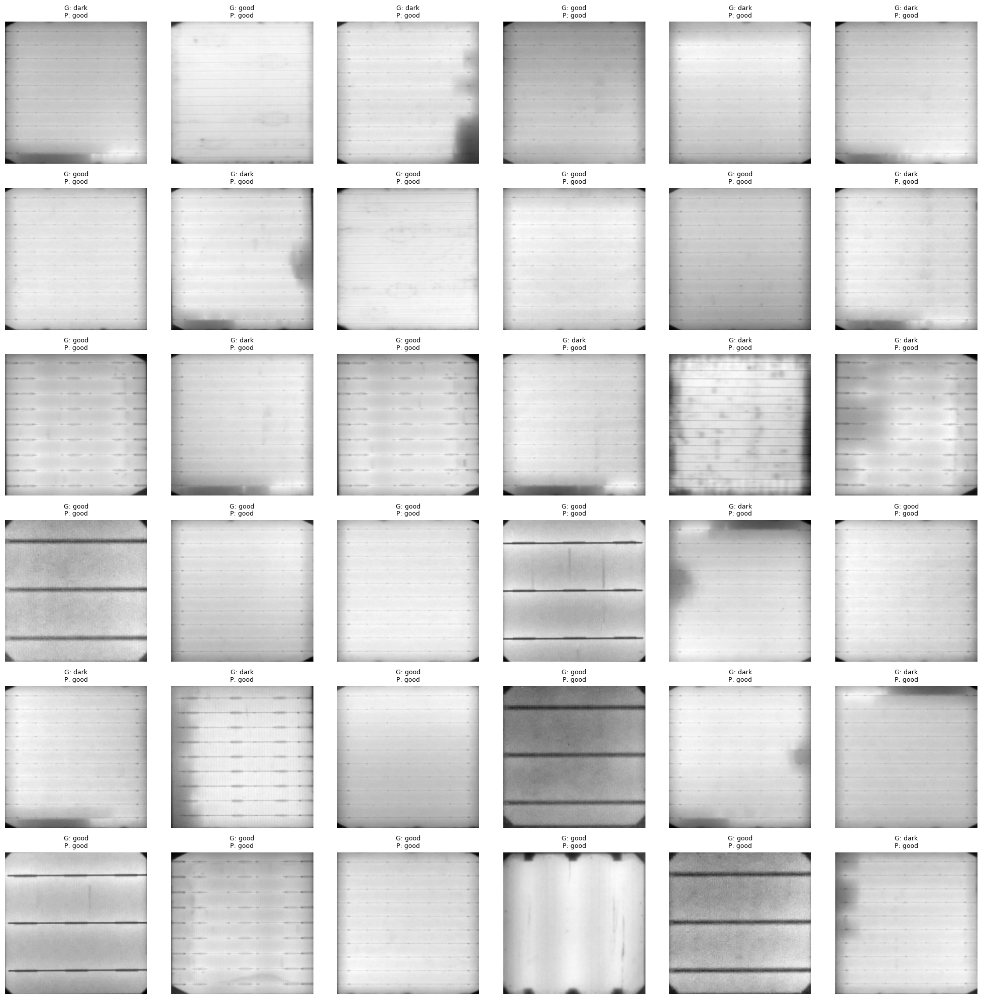

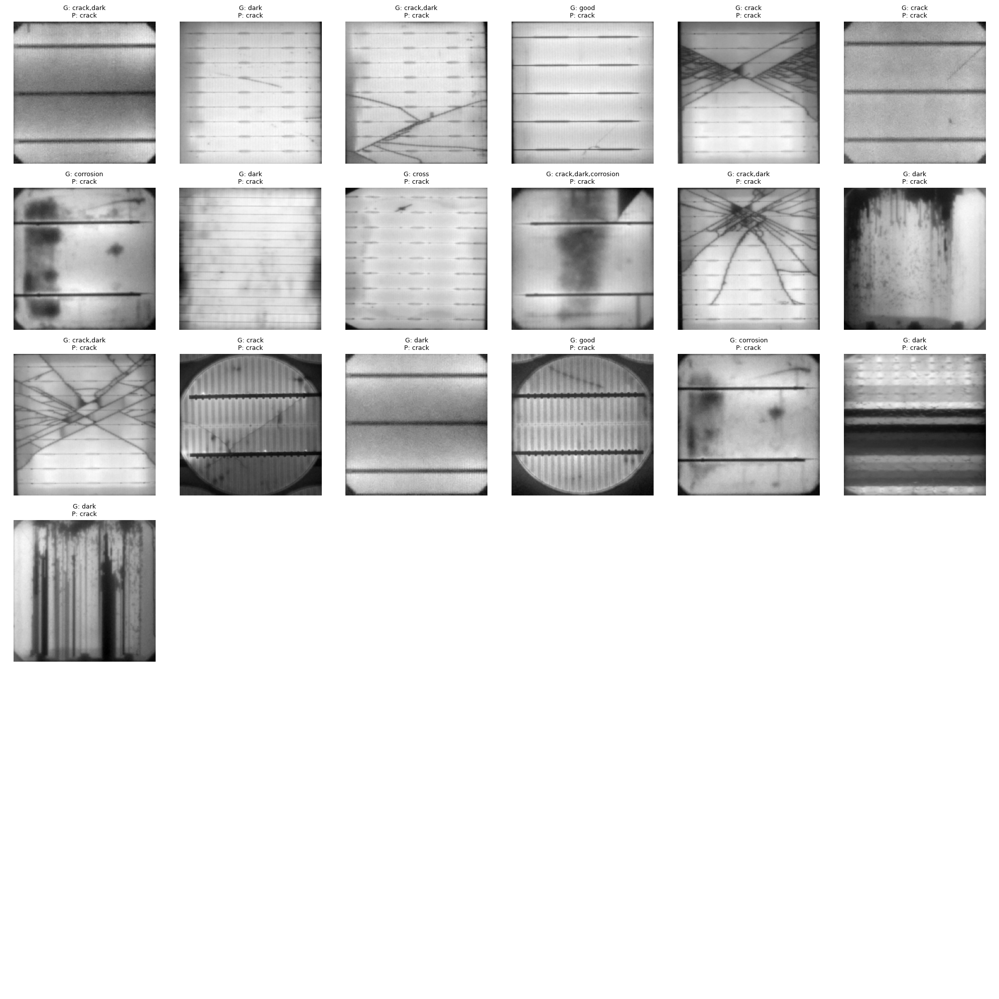

In [67]:
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt
# ...existing code...
def pv_to_display(pv, extractor=None):
    """Convert pixel_values (torch/numpy, possibly normalized) -> HWC uint8 image for plt.imshow."""
    import numpy as np
    # convert torch tensor -> numpy
    if hasattr(pv, "numpy"):
        arr = pv.numpy()
    else:
        arr = np.asarray(pv)

    # handle batched (1, C, H, W)
    if arr.ndim == 4 and arr.shape[0] == 1:
        arr = arr[0]

    # channel-first (C, H, W) -> H, W, C
    if arr.ndim == 3 and arr.shape[0] in (1, 3):
        arr = np.transpose(arr, (1, 2, 0))

    # If already uint8, just clip
    if arr.dtype == np.uint8:
        return np.clip(arr, 0, 255)

    # try to undo extractor normalization if available
    try:
        if extractor is not None and hasattr(extractor, "image_mean") and hasattr(extractor, "image_std"):
            mean = np.array(extractor.image_mean).reshape(1, 1, -1)
            std = np.array(extractor.image_std).reshape(1, 1, -1)
            # if input is channel-first originally, above transpose handled it
            arr = arr * std + mean
    except Exception:
        pass

    # common cases: values in [0,1] -> scale by 255
    amax = arr.max()
    amin = arr.min()
    if amax <= 1.1 and amin >= -0.1:
        arr = (arr - (0.0 if amin >= 0 else amin))  # shift small negatives if present
        arr = arr * 255.0
    else:
        # otherwise linearly rescale to 0-255
        if amax > amin:
            arr = (arr - amin) / (amax - amin) * 255.0
        else:
            arr = np.zeros_like(arr)

    return np.clip(arr, 0, 255).astype(np.uint8)

def vec_to_names(vec, label_names):
    """Convert a 1D one-hot/multi-hot vector (or tensor/list) -> list of label names."""
    arr = np.asarray(vec)
    if arr.ndim > 1:
        arr = arr.ravel()
    inds = np.where(arr.astype(int) == 1)[0]
    return [label_names.get(int(i), str(i)) for i in inds] if len(inds) else []

# Inspect samples predicted as this class index (change as needed)
target_class = 0

# ensure preds in numpy form
preds_arr = np.asarray(predlabels_web)

# select indices where target_class is predicted:
if preds_arr.ndim == 1:
    # single-label predictions (ints)
    class_idx = np.where(preds_arr == target_class)[0]
else:
    # multi-label predictions (multi-hot rows)
    class_idx = np.where(preds_arr[:, target_class] == 1)[0]

n_display = min(36, len(class_idx))

if n_display == 0:
    print(f"No predicted samples for class {target_class}")
else:
    sel = np.random.choice(class_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        s = ds_web[int(idx)]
        pv = s.get('pixel_values', s.get('image'))  # support different keys
        img = pv_to_display(pv, extractor=extractor)

        # true label(s)
        true_vec = s['labels']
        try:
            true_names = vec_to_names(true_vec, label_names)
        except Exception:
            # fallback if labels are scalar ints
            true_names = [label_names.get(int(true_vec), str(int(true_vec)))] if not np.isscalar(true_vec) else [str(true_vec)]

        # predicted label(s)
        pred_item = preds_arr[int(idx)]
        if np.asarray(pred_item).ndim == 0:
            pred_names = [label_names.get(int(pred_item), str(int(pred_item)))]
        else:
            pred_names = vec_to_names(pred_item, label_names)

        true_str = ",".join(true_names) if true_names else "none"
        pred_str = ",".join(pred_names) if pred_names else "none"

        ax.imshow(img)
        ax.set_title(f"G: {true_str}\nP: {pred_str}", fontsize=9)
        ax.axis('off')

    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...
# filepath: /Users/eagle/Documents/eagle-classification/ViT_mulit_label.ipynb
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt

def vec_to_names(vec, label_names):
    """Convert a 1D one-hot/multi-hot vector (or tensor/list) -> list of label names."""
    arr = np.asarray(vec)
    if arr.ndim > 1:
        arr = arr.ravel()
    inds = np.where(arr.astype(int) == 1)[0]
    return [label_names.get(int(i), str(i)) for i in inds] if len(inds) else []

# Inspect samples predicted as this class index (change as needed)
target_class = 1

# ensure preds in numpy form
preds_arr = np.asarray(predlabels_web)

# select indices where target_class is predicted:
if preds_arr.ndim == 1:
    # single-label predictions (ints)
    class_idx = np.where(preds_arr == target_class)[0]
else:
    # multi-label predictions (multi-hot rows)
    class_idx = np.where(preds_arr[:, target_class] == 1)[0]

n_display = min(36, len(class_idx))

if n_display == 0:
    print(f"No predicted samples for class {target_class}")
else:
    sel = np.random.choice(class_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        s = ds_web[int(idx)]
        pv = s.get('pixel_values', s.get('image'))  # support different keys
        img = pv_to_display(pv, extractor=extractor)

        # true label(s)
        true_vec = s['labels']
        try:
            true_names = vec_to_names(true_vec, label_names)
        except Exception:
            # fallback if labels are scalar ints
            true_names = [label_names.get(int(true_vec), str(int(true_vec)))] if not np.isscalar(true_vec) else [str(true_vec)]

        # predicted label(s)
        pred_item = preds_arr[int(idx)]
        if np.asarray(pred_item).ndim == 0:
            pred_names = [label_names.get(int(pred_item), str(int(pred_item)))]
        else:
            pred_names = vec_to_names(pred_item, label_names)

        true_str = ",".join(true_names) if true_names else "none"
        pred_str = ",".join(pred_names) if pred_names else "none"

        ax.imshow(img)
        ax.set_title(f"G: {true_str}\nP: {pred_str}", fontsize=9)
        ax.axis('off')

    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...

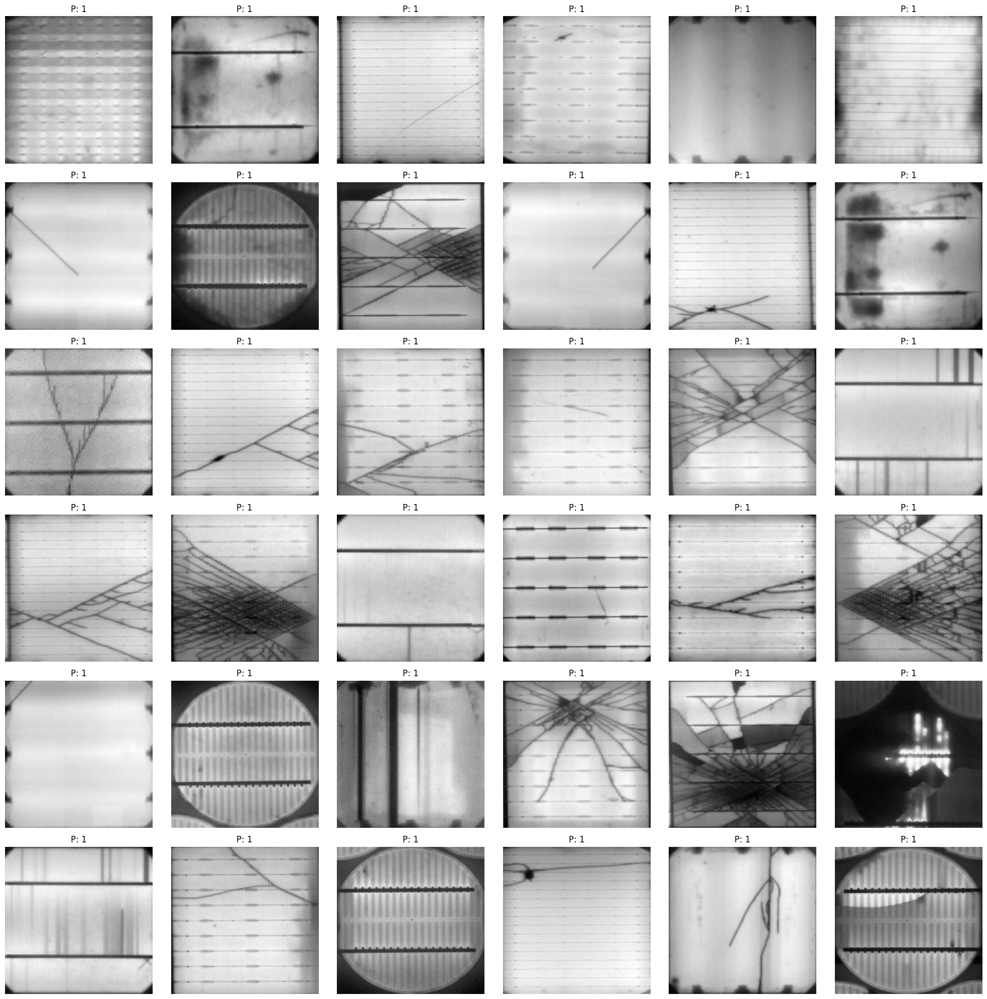

In [36]:
# ...existing code...
def pv_to_display(pv, extractor=None):
    """Convert pixel_values (torch/numpy, possibly normalized) -> HWC uint8 image for plt.imshow."""
    import numpy as np
    # convert torch tensor -> numpy
    if hasattr(pv, "numpy"):
        arr = pv.numpy()
    else:
        arr = np.asarray(pv)

    # handle batched (1, C, H, W)
    if arr.ndim == 4 and arr.shape[0] == 1:
        arr = arr[0]

    # channel-first (C, H, W) -> H, W, C
    if arr.ndim == 3 and arr.shape[0] in (1, 3):
        arr = np.transpose(arr, (1, 2, 0))

    # If already uint8, just clip
    if arr.dtype == np.uint8:
        return np.clip(arr, 0, 255)

    # try to undo extractor normalization if available
    try:
        if extractor is not None and hasattr(extractor, "image_mean") and hasattr(extractor, "image_std"):
            mean = np.array(extractor.image_mean).reshape(1, 1, -1)
            std = np.array(extractor.image_std).reshape(1, 1, -1)
            # if input is channel-first originally, above transpose handled it
            arr = arr * std + mean
    except Exception:
        pass

    # common cases: values in [0,1] -> scale by 255
    amax = arr.max()
    amin = arr.min()
    if amax <= 1.1 and amin >= -0.1:
        arr = (arr - (0.0 if amin >= 0 else amin))  # shift small negatives if present
        arr = arr * 255.0
    else:
        # otherwise linearly rescale to 0-255
        if amax > amin:
            arr = (arr - amin) / (amax - amin) * 255.0
        else:
            arr = np.zeros_like(arr)

    return np.clip(arr, 0, 255).astype(np.uint8)


# plotting class 1 samples (replace previous cell)
import numpy as np
import matplotlib.pyplot as plt

class1_idx = np.where(np.array(predlabels_web) == 1)[0]
n_display = min(36, len(class1_idx))

if n_display == 0:
    print("No predicted class 1 samples found.")
else:
    sel = np.random.choice(class1_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        s = ds_web[int(idx)]
        pv = s['pixel_values']
        img = pv_to_display(pv, extractor=extractor)  # extractor optional
        ax.imshow(img)
        ax.set_title(f"P: {int(predlabels_web[int(idx)])}")
        ax.axis('off')
    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...

# Duramat mono 3 (unlabeled)

In [ ]:
path_all = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_no_pool.pkl"
path_all_max = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_maxpool.pkl"
df_all = pd.read_pickle(path_all)
df_all_max = pd.read_pickle(path_all_max)
df_mono_3 = df_all.loc[df_all_max["technology"]=="mono_3"]
df_mono_3 = batch_transform(df_mono_3)
ds_mono_3 = Dataset.from_dict({
                "image": df_mono_3.pixel_values,
                "labels": np.zeros(df_mono_3.pixel_values.shape[0])
            })
ds_mono_3

Dataset({
    features: ['image', 'labels'],
    num_rows: 807
})

In [ ]:
predictions = trainer.predict(ds_mono_3)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.2632761299610138,
 'test_accuracy': 0.9392812887236679,
 'test_f1': 0.9686900958466453,
 'test_runtime': 45.4231,
 'test_samples_per_second': 17.766,
 'test_steps_per_second': 1.123}

In [ ]:
np.sum(predlabels != 0)

49

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

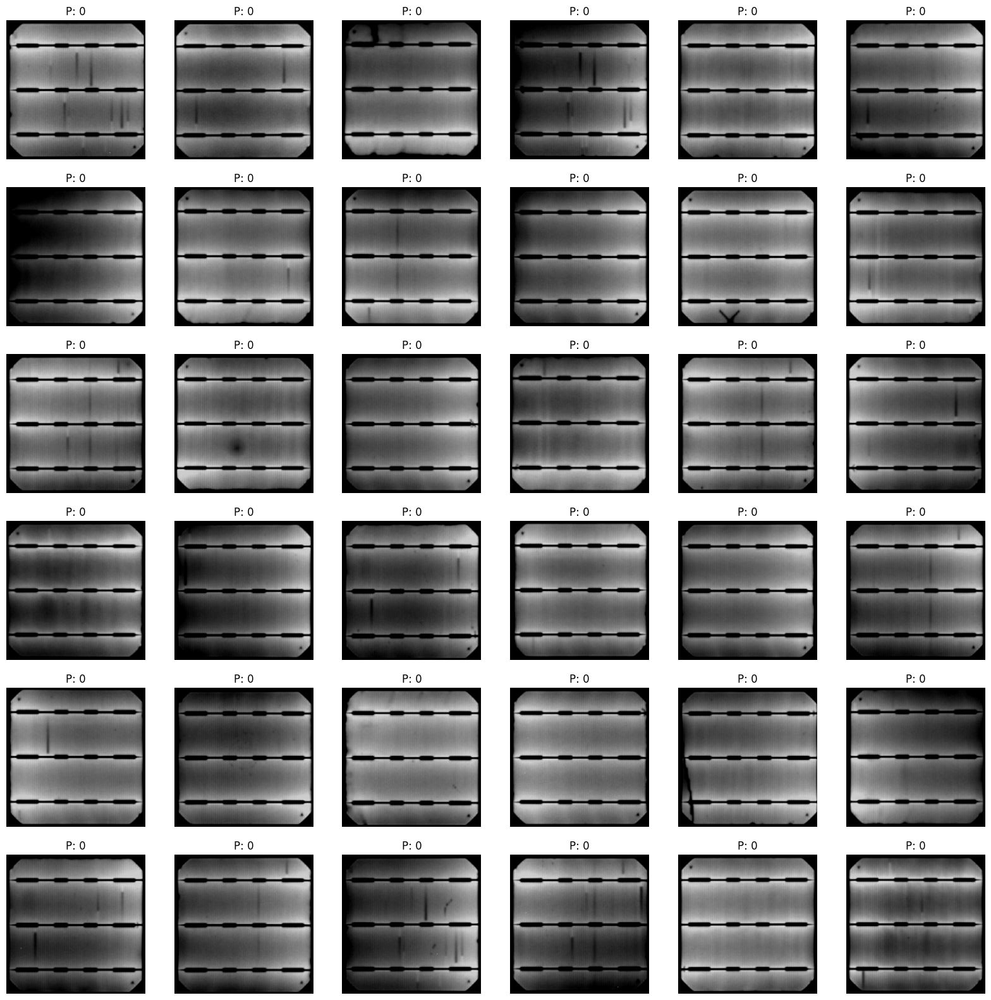

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

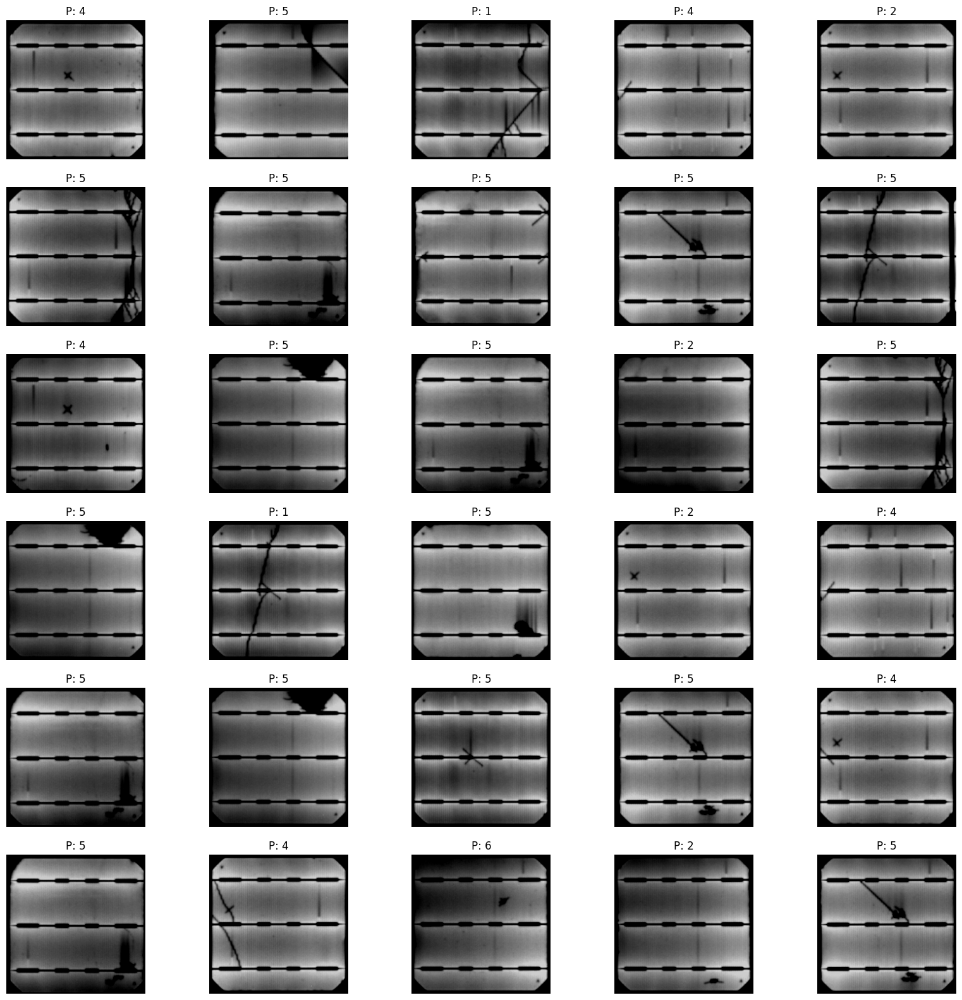

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# Duramat Mono4 (unlabeled)

In [ ]:
import tensorflow as tf

In [ ]:
def extract_original_images(tf_dataset : tf.data.Dataset) -> np.ndarray:
    '''
    Function for the unsupervised case.
    Extracts the original images from a tf Dataset and saves them into a numpy array for further processing (e.g. with UMAP)
    This function assumes that offset = 0 and crop_size = image_size if cropped == none
    This function assumes it is working with images and not features extracted from images.
    '''
    images = []
    for batch_images in tf_dataset:
            for im in batch_images:
                images.append(np.array(im).astype(int))
 
    return images
 
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/duramat_mono4_big"
data_ds_mono4 = tf.keras.utils.image_dataset_from_directory(
            directory=directory,
            labels=None,
            batch_size=128,
            #image_size=image_size,
            seed=42,
            #subset= subset,
            #validation_split=validation_split,
            shuffle = False)
 
original_images = extract_original_images(data_ds_mono4)
 
df_mono_4 = pd.DataFrame(data = {"images" : original_images, "labels": np.zeros(len(original_images))})

df_mono_4 = batch_transform(df_mono_4)
ds_mono_4 = Dataset.from_dict({
                "image": df_mono_4.pixel_values,
                "labels": np.zeros(df_mono_4.pixel_values.shape[0])
            })
ds_mono_4


Found 10620 files.


2024-11-28 16:10:48.366306: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Ultra
2024-11-28 16:10:48.366341: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 128.00 GB
2024-11-28 16:10:48.366346: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 48.00 GB
2024-11-28 16:10:48.366545: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-11-28 16:10:48.366566: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-11-28 16:11:02.346751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Dataset({
    features: ['image', 'labels'],
    num_rows: 10620
})

In [ ]:
predictions = trainer.predict(ds_mono_4)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.41850829124450684,
 'test_accuracy': 0.901412429378531,
 'test_f1': 0.9481503491308869,
 'test_runtime': 578.0253,
 'test_samples_per_second': 18.373,
 'test_steps_per_second': 1.149}

In [ ]:
np.sum(predlabels != 0)

1047

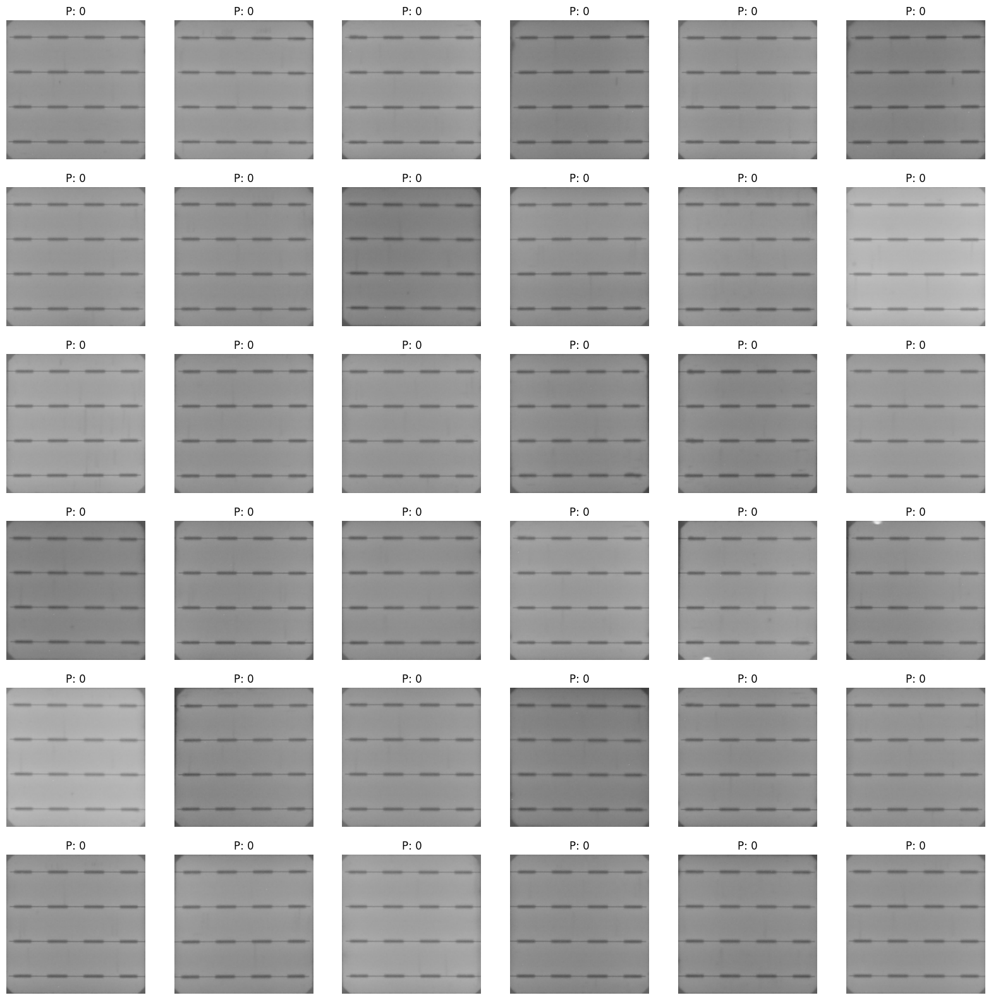

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

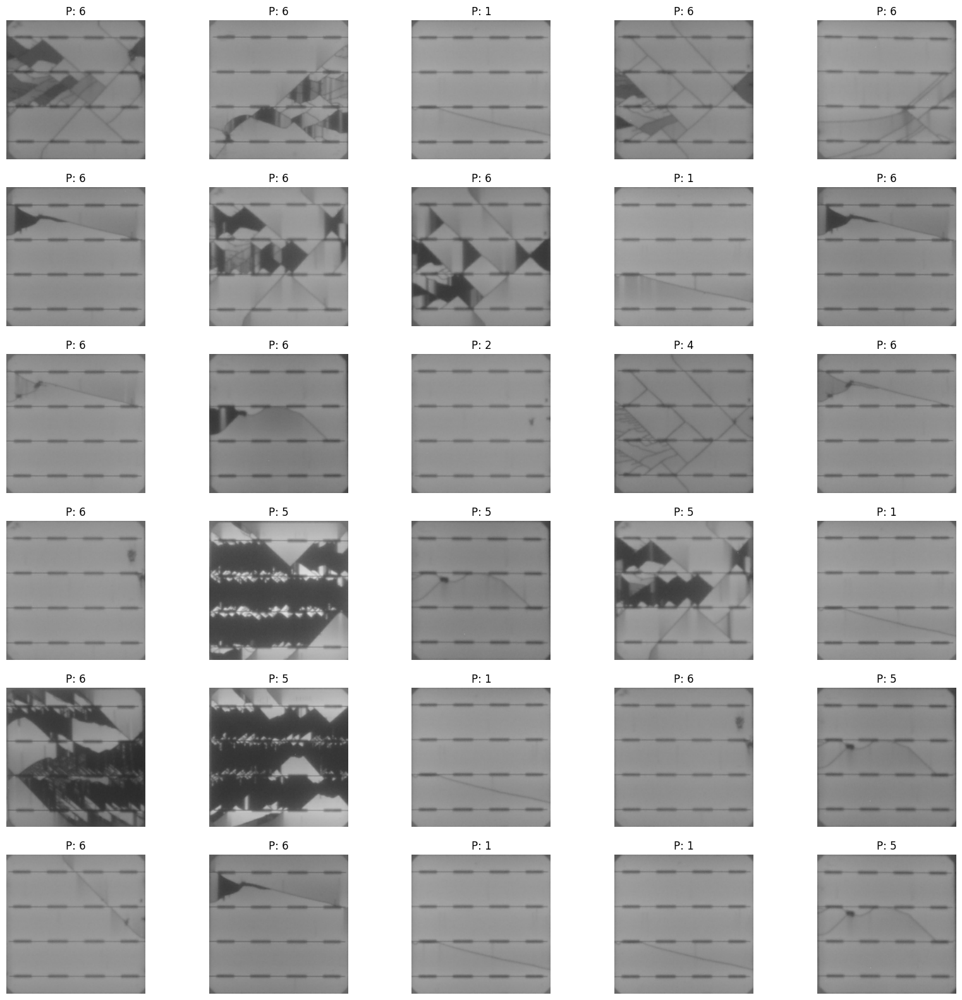

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# TISO (unlabeled)

In [ ]:
import os
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/TISO-EAGLE-23-P09_images"
def decode_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_tiff(img, channels=3)  # Adjust channels as necessary
    img = tf.image.resize(img, [256, 256])  # Resize to desired dimensions
    return img

# Function to process the dataset
def process_path(file_path):
    label = tf.strings.split(file_path, os.path.sep)[-2]
    img = decode_img(file_path)
    return img, label

def LoadTiffDS(directory):
# Create dataset from directory
    data_ds = tf.data.Dataset.list_files(os.path.join(directory, '*/*.tif'))
    data_ds = data_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch the dataset
    data_ds = data_ds.shuffle(buffer_size=1000)
    data_ds = data_ds.batch(batch_size=128)
    data_ds = data_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return data_ds

data_ds_tiso = LoadTiffDS(directory)
 
original_images = extract_original_images(data_ds_tiso)
 
df_tiso = pd.DataFrame(data = {"pixel_value" : original_images, "labels": np.zeros(len(original_images))})

df_tiso = batch_transform(df_tiso)
ds_tiso = Dataset.from_dict({
                "image": df_tiso.pixel_values,
                "labels": np.zeros(df_tiso.pixel_values.shape[0])
            })
ds_tiso

In [ ]:
predictions = trainer.predict(ds_tiso)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

In [ ]:
np.sum(predlabels == 0)

In [ ]:
np.sum(predlabels != 0)

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()